# Data 
Input: processed_expression_data.txt (output of 'gene_expression_processing_pipeline.R')

# Plots to show components and how much variance they take up :
- find explained variance variance
- Plot the Threshold for Explained Variance (90%)
- Plotting Each Component vs. Original Data
code

source: https://dataknowsall.com/blog/pcavisualized.html

Components:	 1 =	 [0.18358596] 	Cumulative Variance
Components:	 25 =	 [0.44940448] 	Cumulative Variance
Components:	 50 =	 [0.51692283] 	Cumulative Variance
Components:	 75 =	 [0.56465768] 	Cumulative Variance
Components:	 100 =	 [0.60357166] 	Cumulative Variance
Components:	 125 =	 [0.6353939] 	Cumulative Variance
Components:	 150 =	 [0.66447422] 	Cumulative Variance
Components:	 175 =	 [0.69139593] 	Cumulative Variance
Components:	 200 =	 [0.71724643] 	Cumulative Variance
Components:	 225 =	 [0.74222512] 	Cumulative Variance
Components:	 250 =	 [0.76631006] 	Cumulative Variance
Components:	 275 =	 [0.78942267] 	Cumulative Variance
Components:	 300 =	 [0.81211622] 	Cumulative Variance
Components:	 325 =	 [0.83387015] 	Cumulative Variance
Components:	 350 =	 [0.85511683] 	Cumulative Variance
Components:	 375 =	 [0.87579526] 	Cumulative Variance
Components:	 400 =	 [0.8959099] 	Cumulative Variance
Components:	 425 =	 [0.91539305] 	Cumulative Variance
Components:	 450 =	 [0.93889523] 	C

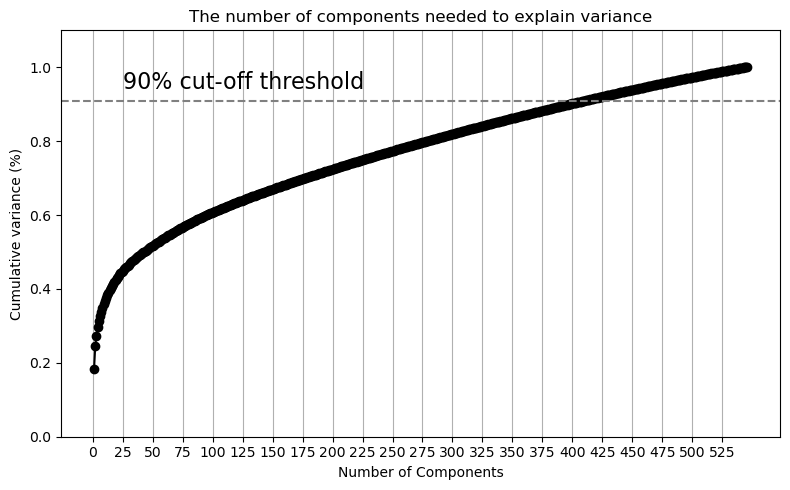

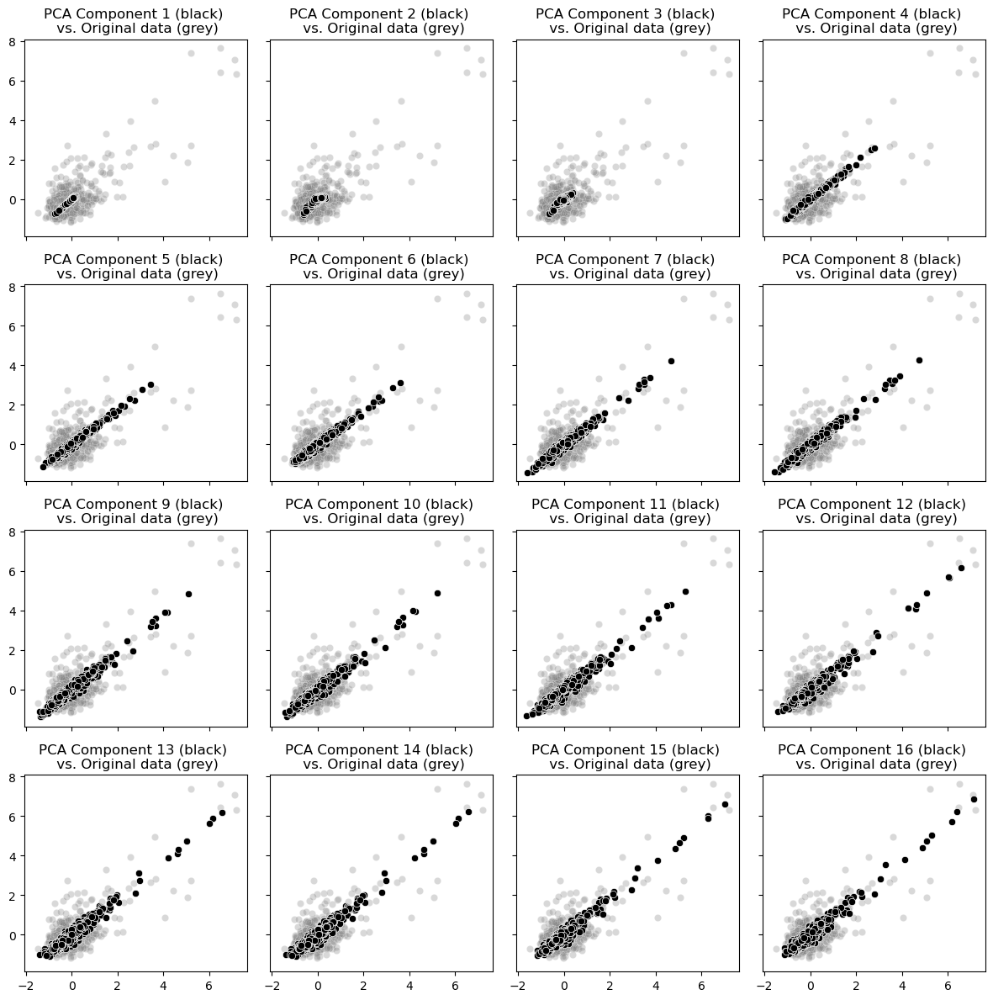

In [2]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly

# Load the data, input: processed_expression_data.txt, from 'gene_expression_processing_pipeline.R'
data_path = 'processed_expression_data.txt' 
data = pd.read_csv(data_path, sep='\t')

total_columns = data.shape[1]

# Subtract 4 from the total number of columns
sample_columns_count = total_columns - 4

# Extract the gene expression data
expression_data = data.iloc[:, 4:].T  # Transpose to have samples as rows and genes as columns


######## find explained variance variance
# Load the data
data = pd.read_csv(data_path, sep='\t')

# Extract the gene expression data
expression_data = data.iloc[:, 4:].T  # Transpose to have samples as rows and genes as columns

# Define the function to get cumulative explained variance
def get_variance(X, n):
    scaler = StandardScaler()
    pca = PCA(n_components=n)
    pca.fit(scaler.fit_transform(X))
    return pca.explained_variance_ratio_.cumsum()[-1:]

# Loop through the number of components and print cumulative variance
for i in range(0, sample_columns_count+1,25):
    if i == 0:
        i = 1
    print('Components:\t', i, '=\t', get_variance(expression_data, i), '\tCumulative Variance')

############Plot the Threshold for Explained Variance
import numpy as np

# Calculate cumulative variance
# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(expression_data)
pca_full = PCA().fit(X_scaled)
cumulative_variance = np.cumsum(pca_full.explained_variance_ratio_)

# Plot cumulative variance
plt.rcParams["figure.figsize"] = (8, 5)
fig, ax = plt.subplots()
xi = np.arange(1, len(cumulative_variance) + 1, step=1)
plt.ylim(0.0, 1.1)
plt.plot(xi, cumulative_variance, marker='o', linestyle='-', color='black')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, len(cumulative_variance) + 1, step=25))  # Show every 25 components
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.91, color='grey', linestyle='--')
plt.text(25, 0.94, '90% cut-off threshold', color='black', fontsize=16)

ax.grid(axis='x')
plt.tight_layout()
plt.show()

########## Plotting Each Component vs. Original Data

# Define the function to transform data using PCA
def transform_pca(X, n):
    pca = PCA(n_components=n)
    pca.fit(X)
    X_new = pca.inverse_transform(pca.transform(X))
    return X_new

# Set up the grid for plots
rows = 4
cols = 4
comps = 1

# Scale the data
scaler = StandardScaler()
# Extract the gene expression data
expression_data = data.iloc[:, 4:].T  # Transpose to have samples as rows and genes as columns
X_scaled = scaler.fit_transform(expression_data)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(12,12), sharex=True, sharey=True)

# Loop through the grid and plot PCA results
for row in range(rows):
    for col in range(cols):
        try:
            X_new = transform_pca(X_scaled, comps)
            ax = sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], ax=axes[row, col], color='grey', alpha=.3)
            ax = sns.scatterplot(x=X_new[:, 0], y=X_new[:, 1], ax=axes[row, col], color='black')
            ax.set_title(f'PCA Component {comps} (black) \n vs. Original data (grey)')
            comps += 1
        except:
            pass

plt.tight_layout()
plt.show()



# PCA plots for T0 vs T120
- fig. 1. Plot of PCA of Gene expression Data (PC1 vs PC2)
- fig. 2. 3D Plot PCA of Gene expression Data (PC1 vs. 2 vs. 3)
- fig. 3. Interactive 3D plot of Gene expression Data (PC1 vs. 2 vs. 3)
- fig. 4. Scatter Plot matrix of Gene expression Data (PC1,2,3 and 4)
- fig. 5. Interactive Scatter Plot matrix of Gene expression Data (PC1,2,3 and 4)

  source: https://plotly.com/python/splom/

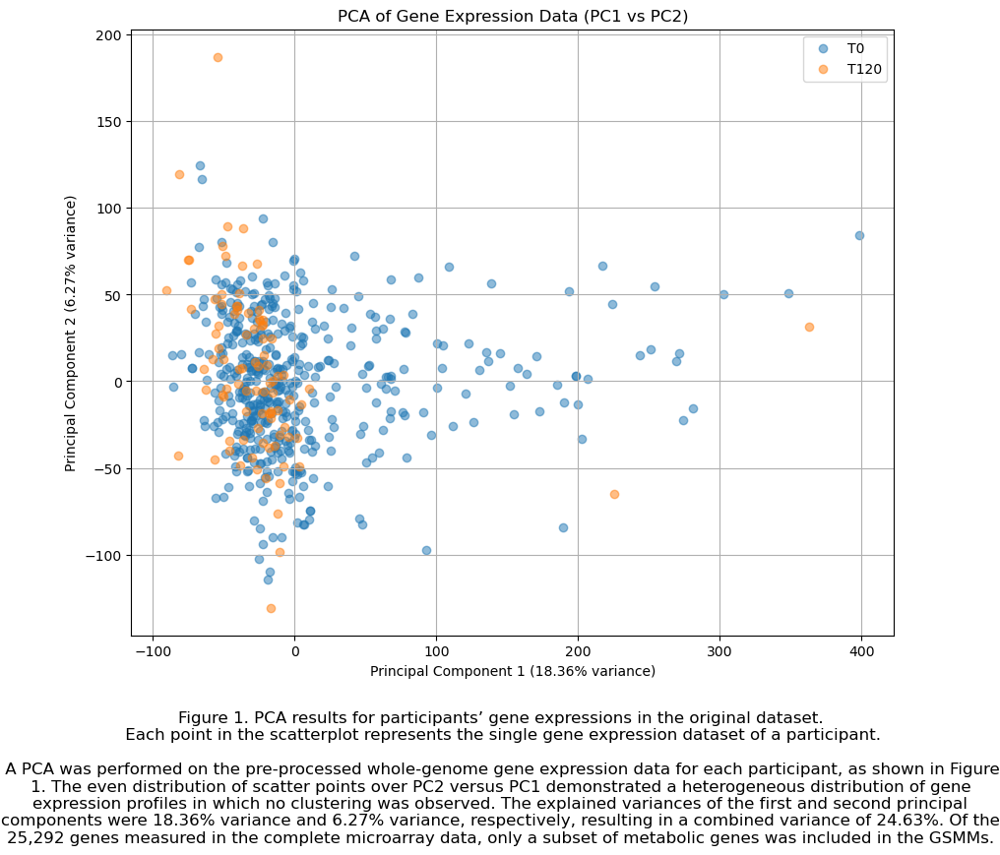

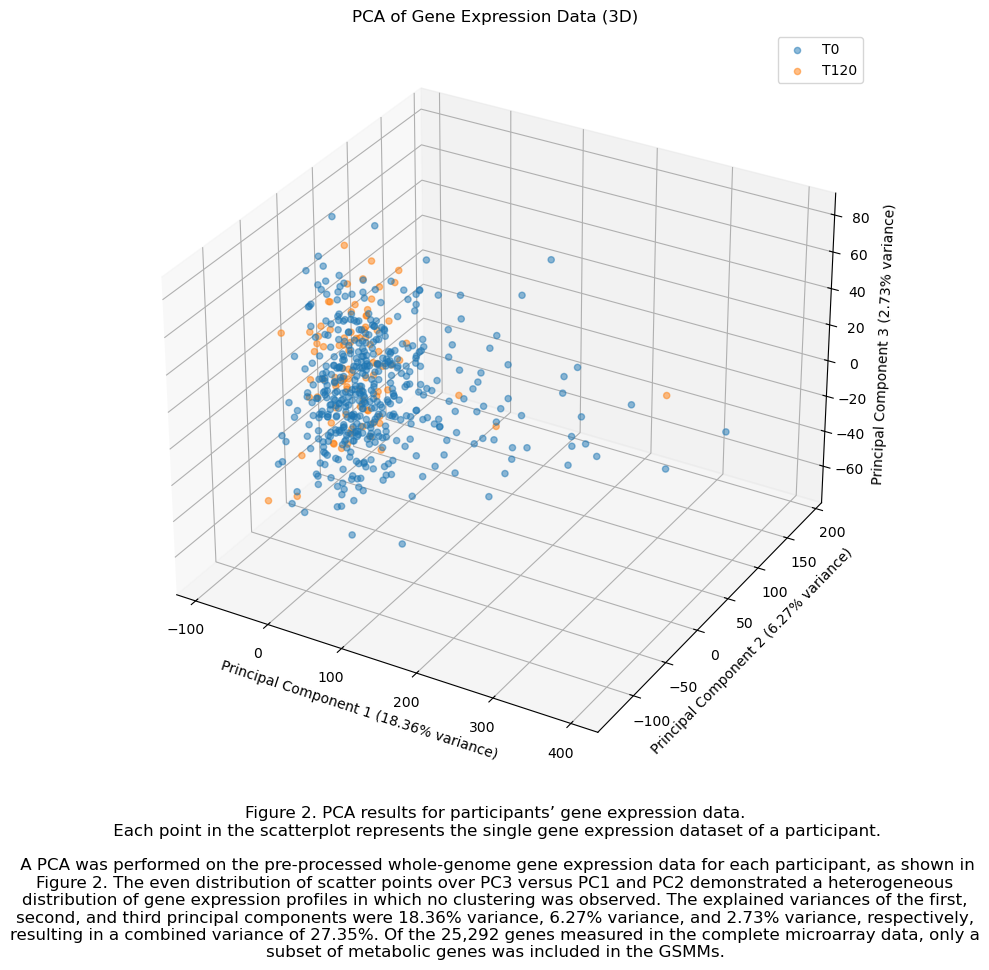

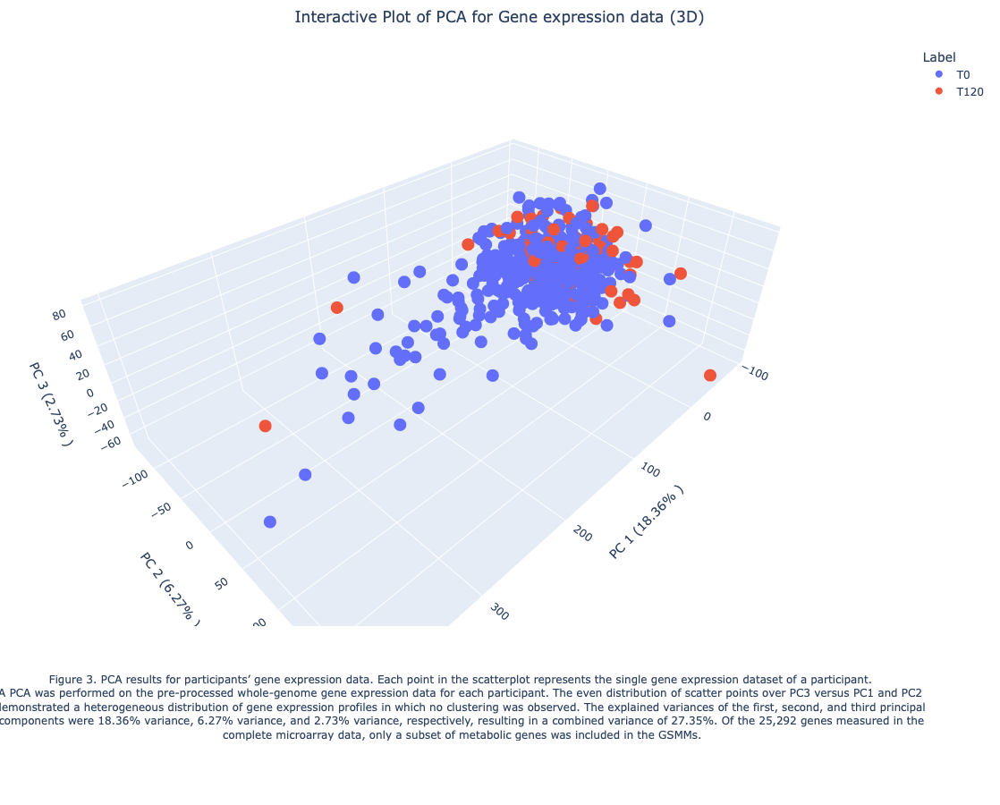

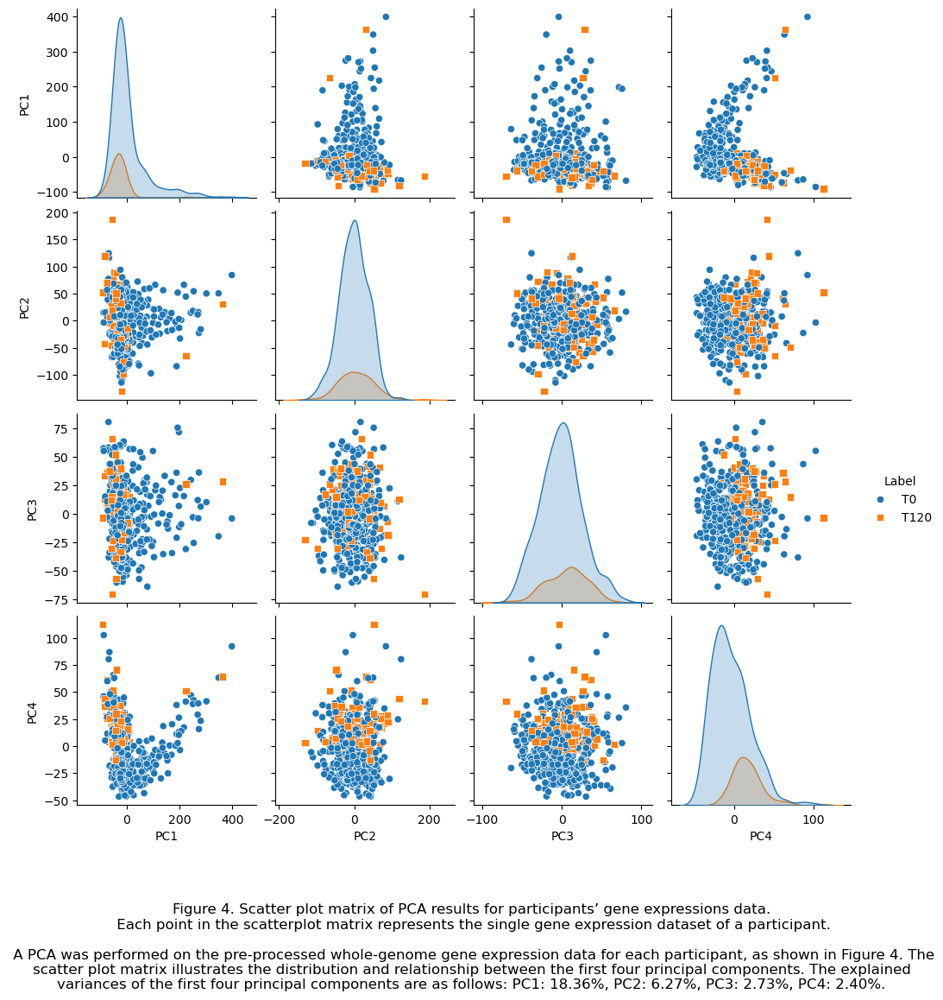

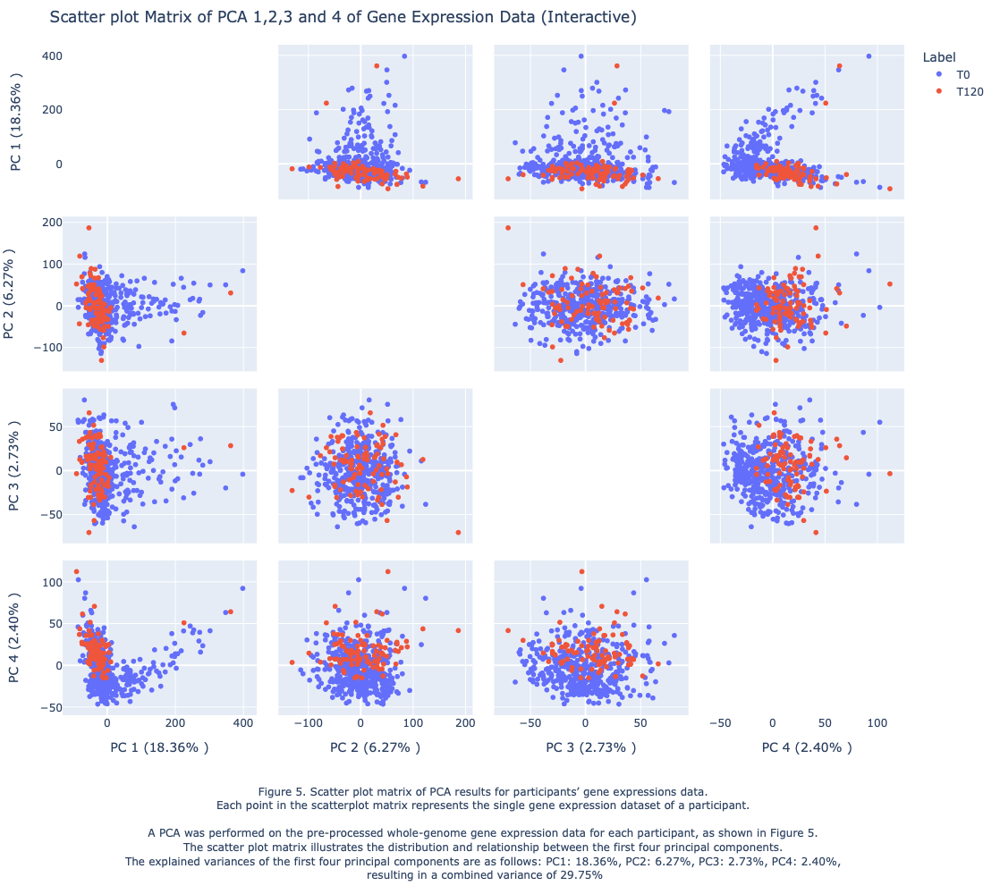

In [4]:
#############fig 1.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# File path
file_path = '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/VAn bussel TAR_/processed_expression_data.txt'

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the time (T0 or T120)
labels = []
for sample in sample_info:
    if 'T0' in sample:
        labels.append('T0')
    elif 'T120' in sample:
        labels.append('T120')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_

# Plot the PCA results in 2D (PC1 vs PC2)
plt.figure(figsize=(10, 8))
for label in np.unique(labels):
    plt.scatter(pca_df[pca_df['Label'] == label]['PC1'], 
                pca_df[pca_df['Label'] == label]['PC2'], 
                label=label, alpha=0.5)
plt.xlabel(f'Principal Component 1 ({explained_variance[0]*100:.2f}% variance)')
plt.ylabel(f'Principal Component 2 ({explained_variance[1]*100:.2f}% variance)')
plt.title('PCA of Gene Expression Data (PC1 vs PC2)')
plt.legend()
plt.grid()
plt.figtext(0.5, -0.15, (f'Figure 1. PCA results for participants’ gene expression data.\n Each point in the scatterplot represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 1. The even distribution of scatter points over PC2 versus PC1 demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first and second principal components were {explained_variance[0]*100:.2f}% variance and {explained_variance[1]*100:.2f}% variance, respectively, resulting in a combined variance of {((explained_variance[0]*100)+(explained_variance[1]*100)):.2f}%. Of the 25,292 genes measured in the complete microarray data, only a subset of metabolic genes was included in the GSMMs.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

#############fig 2.
# Plot the PCA results in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
for label in np.unique(labels):
    ax.scatter(pca_df[pca_df['Label'] == label]['PC1'], 
               pca_df[pca_df['Label'] == label]['PC2'], 
               pca_df[pca_df['Label'] == label]['PC3'], 
               label=label, alpha=0.5)
ax.set_xlabel(f'Principal Component 1 ({explained_variance[0]*100:.2f}% variance)')
ax.set_ylabel(f'Principal Component 2 ({explained_variance[1]*100:.2f}% variance)')
ax.set_zlabel(f'Principal Component 3 ({explained_variance[2]*100:.2f}% variance)')
plt.title('PCA of Gene Expression Data (3D)')
plt.legend()
plt.tight_layout()  # Adjust layout to ensure everything fits without overlapping
plt.figtext(0.5, -0.2, (f'Figure 2. PCA results for participants’ gene expression data.\n Each point in the scatterplot represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 2. The even distribution of scatter points over PC3 versus PC1 and PC2 demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first, second, and third principal components were {explained_variance[0]*100:.2f}% variance, {explained_variance[1]*100:.2f}% variance, and {explained_variance[2]*100:.2f}% variance, respectively, resulting in a combined variance of {((explained_variance[0]*100)+(explained_variance[1]*100)+(explained_variance[2]*100)):.2f}%. Of the 25,292 genes measured in the complete microarray data, only a subset of metabolic genes was included in the GSMMs.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

#############fig 3.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import plotly.graph_objects as go
import re

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the time (T0 or T120)
labels = []
for sample in sample_info:
    if 'T0' in sample:
        labels.append('T0')
    elif 'T120' in sample:
        labels.append('T120')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=3)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
total_var = explained_variance.sum() * 100

# Create a 3D scatter plot using Plotly
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3', color='Label',
    title=f' Interactive Plot of PCA for Gene expression data (3D)',
    labels={'PC1': f'PC 1 ({explained_variance[0]*100:.2f}% )',
            'PC2': f'PC 2 ({explained_variance[1]*100:.2f}% )',
            'PC3': f'PC 3 ({explained_variance[2]*100:.2f}% )'}
)

# Update layout to make the plot bigger
fig.update_layout(
    width=1200,  # Width of the plot
    height=900,  # Height of the plot
    margin=dict(l=20, r=20, t=50, b=200),  # Adjust margins to make room for the annotation
    title={'x': 0.5, 'xanchor': 'center'},  # Center the title
)

# Add annotation (figure text) at the bottom
fig.add_annotation(
    text=(
        f"Figure 3. PCA results for participants’ gene expression data. Each point in the scatterplot represents the single gene expression dataset of a participant.<br> A PCA was performed on the pre-processed whole-genome gene expression data for each participant. The even distribution of scatter points over PC3 versus PC1 and PC2 <br> demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first, second, and third principal <br> components were {explained_variance[0]*100:.2f}% variance, {explained_variance[1]*100:.2f}% variance, and {explained_variance[2]*100:.2f}% variance, respectively, resulting in a combined variance of {total_var:.2f}%. Of the 25,292 genes measured in the<br> complete microarray data, only a subset of metabolic genes was included in the GSMMs."
    ),
    xref="paper", yref="paper",
    x=0.5, y=-0.2, showarrow=False,
    font=dict(size=12),
    align="center"
)

# Update annotation to set an explicit width
fig.update_annotations(width=1100)  # Set the width of the text box

fig.show()


#############fig 4.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the time (T0 or T120)
labels = []
for sample in sample_info:
    if 'T0' in sample:
        labels.append('T0')
    elif 'T120' in sample:
        labels.append('T120')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
# Plot the scatter plot matrix of PCA components
sns.pairplot(pca_df, hue='Label', markers=["o", "s"])
plt.figtext(0.5, -0.15, (f'Figure 4. Scatter plot matrix of PCA results for participants’ gene expressions data.\n Each point in the scatterplot matrix represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 4. The scatter plot matrix illustrates the distribution and relationship between the first four principal components. The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

# Display the PCA DataFrame with variance
pca_df.head(), explained_variance
#############fig 5.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px


# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the time (T0 or T120)
labels = []
for sample in sample_info:
    if 'T0' in sample:
        labels.append('T0')
    elif 'T120' in sample:
        labels.append('T120')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
total_variance = explained_variance[:4].sum() * 100


# Create labels for the plotly scatter matrix
labels = {
    'PC1': f"PC 1 ({explained_variance[0]*100:.2f}% )",
    'PC2': f"PC 2 ({explained_variance[1]*100:.2f}% )",
    'PC3': f"PC 3 ({explained_variance[2]*100:.2f}% )",
    'PC4': f"PC 4 ({explained_variance[3]*100:.2f}% )"
}

# Create the scatter plot matrix using plotly
fig = px.scatter_matrix(
    pca_df,
    dimensions=['PC1', 'PC2', 'PC3', 'PC4'],
    color='Label',
    labels=labels
)

# Update traces to hide diagonal plots
fig.update_traces(diagonal_visible=False)

# Add the figure text
fig.update_layout(
    title='Scatter plot Matrix of PCA 1,2,3 and 4 of Gene Expression Data (Interactive)',
    annotations=[
        dict(
            x=0.5,
            y=-0.1,
            showarrow=False,
            text=(
                f"Figure 5. Scatter plot matrix of PCA results for participants’ gene expressions data.<br>"
                f"Each point in the scatterplot matrix represents the single gene expression dataset of a participant.<br><br>"
                f"A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 5.<br>"
                f"The scatter plot matrix illustrates the distribution and relationship between the first four principal components.<br>"
                f"The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, "
                f"PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%,<br> resulting in a combined variance of {total_variance:.2f}%"
            ),
            xref='paper',
            yref='paper',
            xanchor='center',
            yanchor='top',
            font=dict(size=12)
        )
    ],
    autosize=True,
    height=1000,  # Adjust the height of the plot
    width=1000,   # Adjust the width of the plot
    margin=dict(l=20, r=20, t=50, b=200)  # Adjust margins to make room for the annotation
)

fig.show()



# PCA plots for D2 vs. D3
- fig. 1. Plot of PCA of Gene expression Data (PC1 vs PC2)
- fig. 2. 3D Plot PCA of Gene expression Data (PC1 vs. 2 vs. 3)
- fig. 3. Interactive 3D plot of Gene expression Data (PC1 vs. 2 vs. 3)
- fig. 4. Scatter Plot matrix of Gene expression Data (PC1,2,3 and 4)
- fig. 5. Interactive Scatter Plot matrix of Gene expression Data (PC1,2,3 and 4)

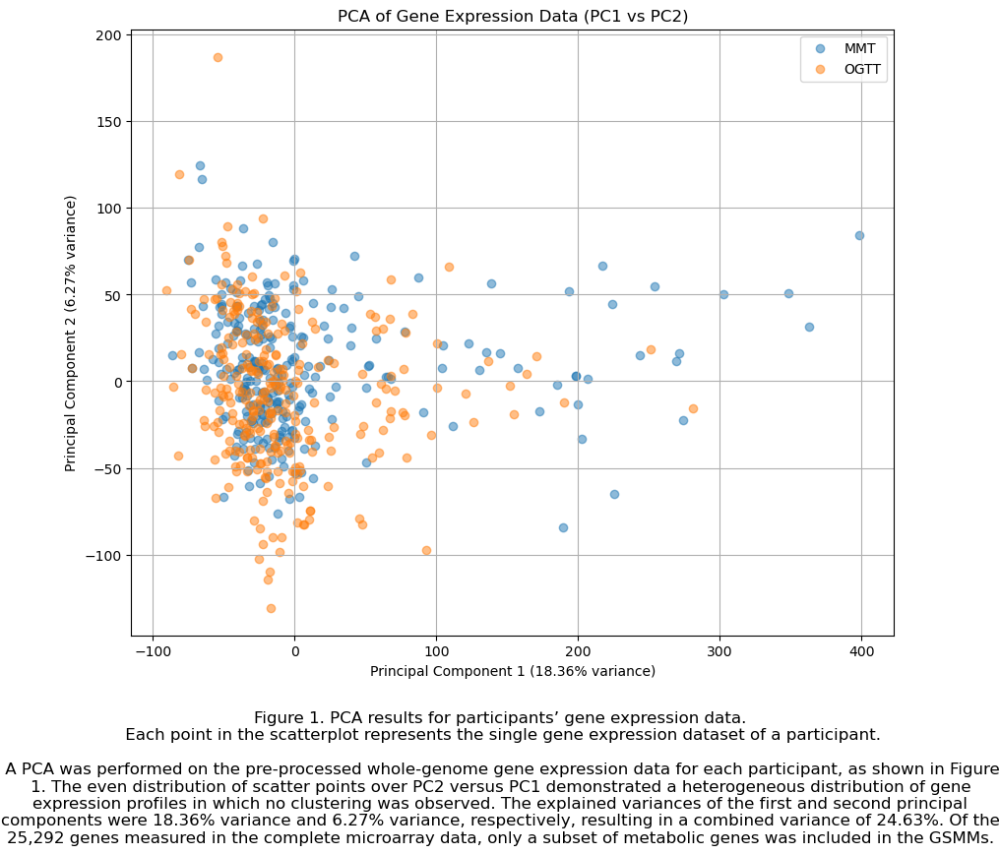

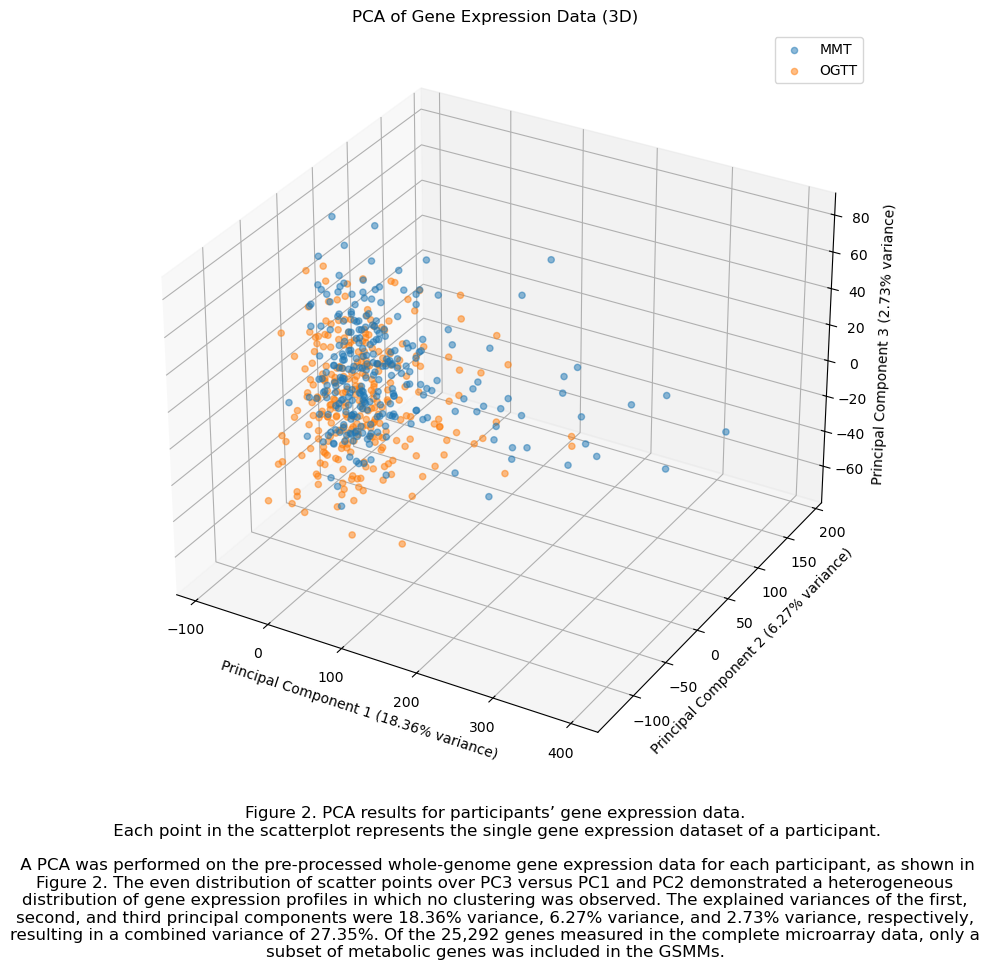

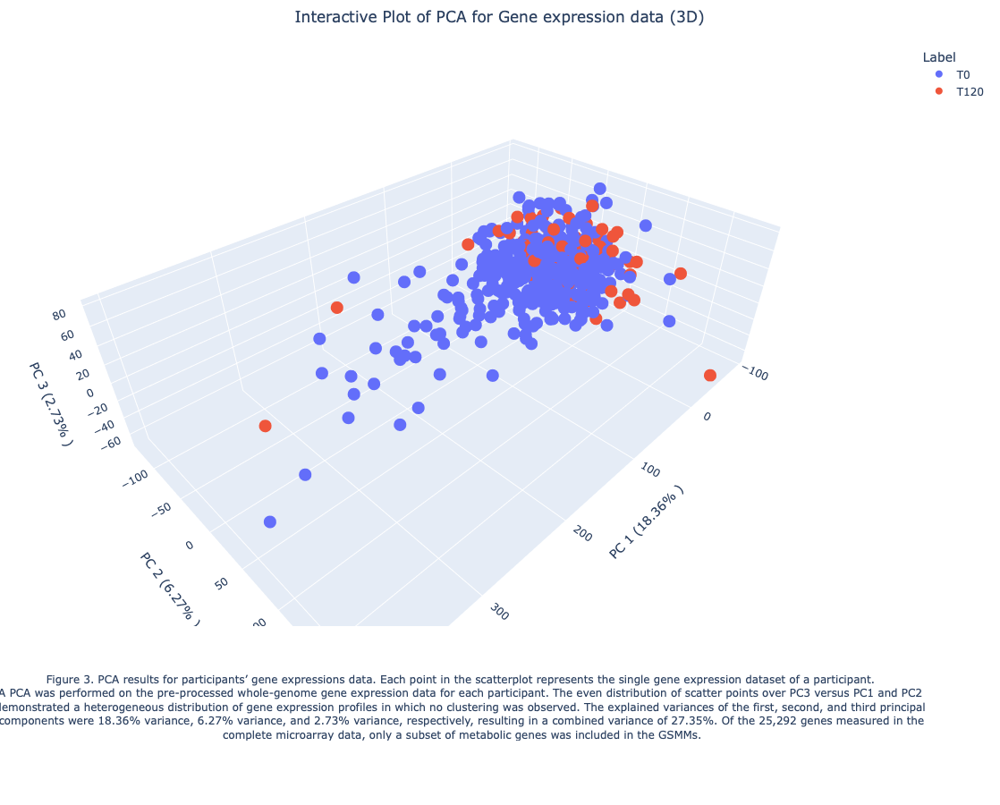

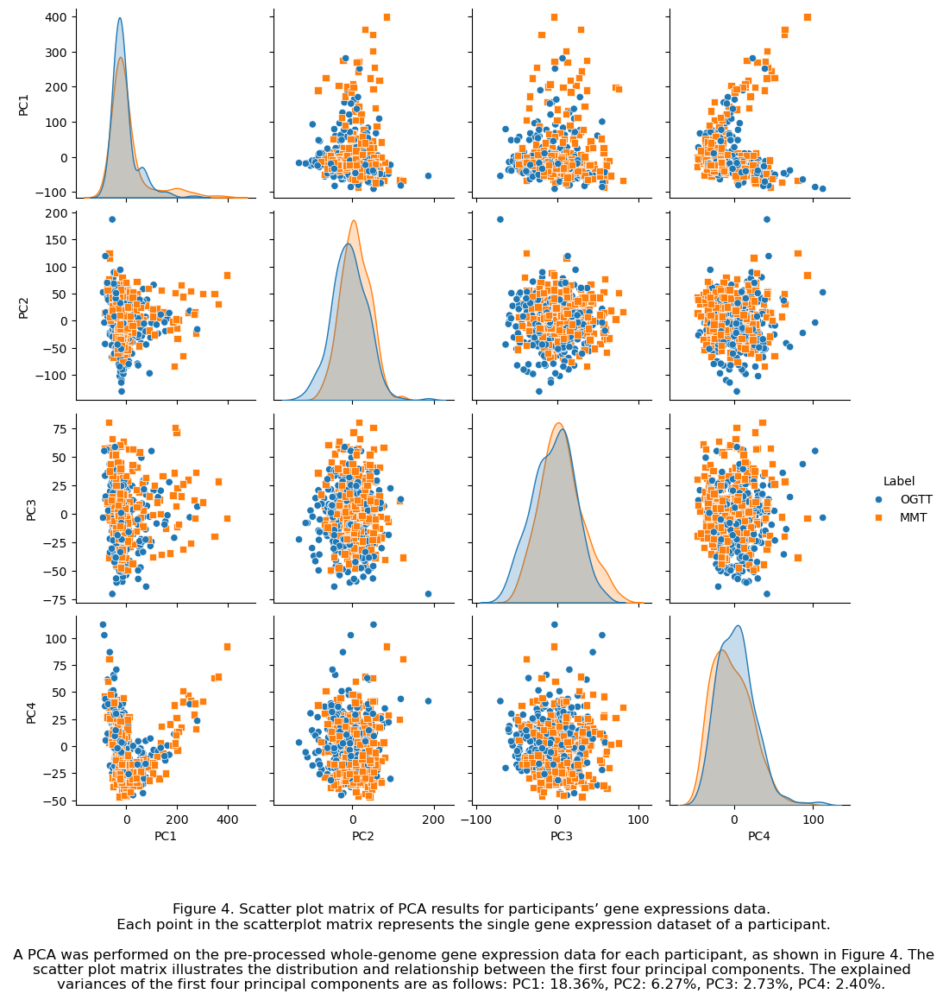

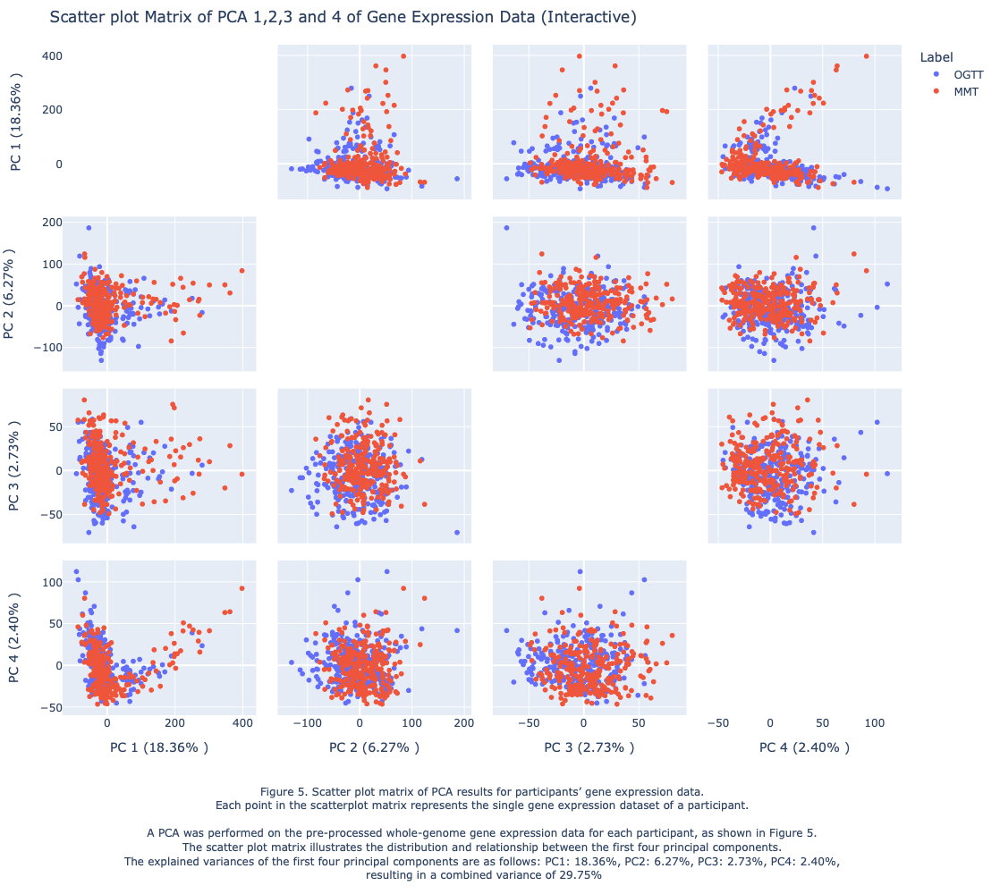

In [7]:
#############fig 1.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the day (D5 or D18)
labels = []
for sample in sample_info:
    if 'D2' in sample:
        labels.append('OGTT')
    elif 'D3' in sample:
        labels.append('MMT')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_

# Plot the PCA results in 2D (PC1 vs PC2)
plt.figure(figsize=(10, 8))
for label in np.unique(labels):
    plt.scatter(pca_df[pca_df['Label'] == label]['PC1'], 
                pca_df[pca_df['Label'] == label]['PC2'], 
                label=label, alpha=0.5)
plt.xlabel(f'Principal Component 1 ({explained_variance[0]*100:.2f}% variance)')
plt.ylabel(f'Principal Component 2 ({explained_variance[1]*100:.2f}% variance)')
plt.title('PCA of Gene Expression Data (PC1 vs PC2)')
plt.legend()
plt.grid()
plt.figtext(0.5, -0.15, (f'Figure 1. PCA results for participants’ gene expression data.\n Each point in the scatterplot represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 1. The even distribution of scatter points over PC2 versus PC1 demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first and second principal components were {explained_variance[0]*100:.2f}% variance and {explained_variance[1]*100:.2f}% variance, respectively, resulting in a combined variance of {((explained_variance[0]*100)+(explained_variance[1]*100)):.2f}%. Of the 25,292 genes measured in the complete microarray data, only a subset of metabolic genes was included in the GSMMs.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

#############fig 2.
# Plot the PCA results in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
for label in np.unique(labels):
    ax.scatter(pca_df[pca_df['Label'] == label]['PC1'], 
               pca_df[pca_df['Label'] == label]['PC2'], 
               pca_df[pca_df['Label'] == label]['PC3'], 
               label=label, alpha=0.5)
ax.set_xlabel(f'Principal Component 1 ({explained_variance[0]*100:.2f}% variance)')
ax.set_ylabel(f'Principal Component 2 ({explained_variance[1]*100:.2f}% variance)')
ax.set_zlabel(f'Principal Component 3 ({explained_variance[2]*100:.2f}% variance)')
plt.title('PCA of Gene Expression Data (3D)')
plt.legend()
plt.tight_layout()  # Adjust layout to ensure everything fits without overlapping
plt.figtext(0.5, -0.2, (f'Figure 2. PCA results for participants’ gene expression data.\n Each point in the scatterplot represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 2. The even distribution of scatter points over PC3 versus PC1 and PC2 demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first, second, and third principal components were {explained_variance[0]*100:.2f}% variance, {explained_variance[1]*100:.2f}% variance, and {explained_variance[2]*100:.2f}% variance, respectively, resulting in a combined variance of {((explained_variance[0]*100)+(explained_variance[1]*100)+(explained_variance[2]*100)):.2f}%. Of the 25,292 genes measured in the complete microarray data, only a subset of metabolic genes was included in the GSMMs.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

#############fig 3.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import plotly.graph_objects as go
import re

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the time (T0 or T120)
labels = []
for sample in sample_info:
    if 'T0' in sample:
        labels.append('T0')
    elif 'T120' in sample:
        labels.append('T120')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=3)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
total_var = explained_variance.sum() * 100

# Create a 3D scatter plot using Plotly
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3', color='Label',
    title=f' Interactive Plot of PCA for Gene expression data (3D)',
    labels={'PC1': f'PC 1 ({explained_variance[0]*100:.2f}% )',
            'PC2': f'PC 2 ({explained_variance[1]*100:.2f}% )',
            'PC3': f'PC 3 ({explained_variance[2]*100:.2f}% )'}
)

# Update layout to make the plot bigger
fig.update_layout(
    width=1200,  # Width of the plot
    height=900,  # Height of the plot
    margin=dict(l=20, r=20, t=50, b=200),  # Adjust margins to make room for the annotation
    title={'x': 0.5, 'xanchor': 'center'},  # Center the title
)

# Add annotation (figure text) at the bottom
fig.add_annotation(
    text=(
        f"Figure 3. PCA results for participants’ gene expressions data. Each point in the scatterplot represents the single gene expression dataset of a participant.<br> A PCA was performed on the pre-processed whole-genome gene expression data for each participant. The even distribution of scatter points over PC3 versus PC1 and PC2 <br> demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first, second, and third principal <br> components were {explained_variance[0]*100:.2f}% variance, {explained_variance[1]*100:.2f}% variance, and {explained_variance[2]*100:.2f}% variance, respectively, resulting in a combined variance of {total_var:.2f}%. Of the 25,292 genes measured in the<br> complete microarray data, only a subset of metabolic genes was included in the GSMMs."
    ),
    xref="paper", yref="paper",
    x=0.5, y=-0.2, showarrow=False,
    font=dict(size=12),
    align="center"
)

# Update annotation to set an explicit width
fig.update_annotations(width=1100)  # Set the width of the text box

fig.show()


#############fig 4.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the time (T0 or T120)
labels = []
for sample in sample_info:
    if 'D2' in sample:
        labels.append('OGTT')
    elif 'D3' in sample:
        labels.append('MMT')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
# Plot the scatter plot matrix of PCA components
sns.pairplot(pca_df, hue='Label', markers=["o", "s"])
plt.figtext(0.5, -0.15, (f'Figure 4. Scatter plot matrix of PCA results for participants’ gene expressions data.\n Each point in the scatterplot matrix represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 4. The scatter plot matrix illustrates the distribution and relationship between the first four principal components. The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

# Display the PCA DataFrame with variance
pca_df.head(), explained_variance
#############fig 5.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px


# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the day (D2 or D3)
labels = []
for sample in sample_info:
    if 'D2' in sample:
        labels.append('OGTT')
    elif 'D3' in sample:
        labels.append('MMT')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
total_variance = explained_variance[:4].sum() * 100


# Create labels for the plotly scatter matrix
labels = {
    'PC1': f"PC 1 ({explained_variance[0]*100:.2f}% )",
    'PC2': f"PC 2 ({explained_variance[1]*100:.2f}% )",
    'PC3': f"PC 3 ({explained_variance[2]*100:.2f}% )",
    'PC4': f"PC 4 ({explained_variance[3]*100:.2f}% )"
}

# Create the scatter plot matrix using plotly
fig = px.scatter_matrix(
    pca_df,
    dimensions=['PC1', 'PC2', 'PC3', 'PC4'],
    color='Label',
    labels=labels
)

# Update traces to hide diagonal plots
fig.update_traces(diagonal_visible=False)

# Add the figure text
fig.update_layout(
    title='Scatter plot Matrix of PCA 1,2,3 and 4 of Gene Expression Data (Interactive)',
    annotations=[
        dict(
            x=0.5,
            y=-0.1,
            showarrow=False,
            text=(
                f"Figure 5. Scatter plot matrix of PCA results for participants’ gene expression data.<br>"
                f"Each point in the scatterplot matrix represents the single gene expression dataset of a participant.<br><br>"
                f"A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 5.<br>"
                f"The scatter plot matrix illustrates the distribution and relationship between the first four principal components.<br>"
                f"The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, "
                f"PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%,<br> resulting in a combined variance of {total_variance:.2f}%"
            ),
            xref='paper',
            yref='paper',
            xanchor='center',
            yanchor='top',
            font=dict(size=12)
        )
    ],
    autosize=True,
    height=1000,  # Adjust the height of the plot
    width=1000,   # Adjust the width of the plot
    margin=dict(l=20, r=20, t=50, b=200)  # Adjust margins to make room for the annotation
)

fig.show()



# PCA plots for W5 vs. W18
- fig. 1. Plot of PCA of Gene expression Data (PC1 vs PC2)
- fig. 2. 3D Plot PCA of Gene expression Data (PC1 vs. 2 vs. 3)
- fig. 3. Interactive 3D plot of Gene expression Data (PC1 vs. 2 vs. 3)
- fig. 4. Scatter Plot matrix of Gene expression Data (PC1,2,3 and 4)
- fig. 5. Interactive Scatter Plot matrix of Gene expression Data (PC1,2,3 and 4)

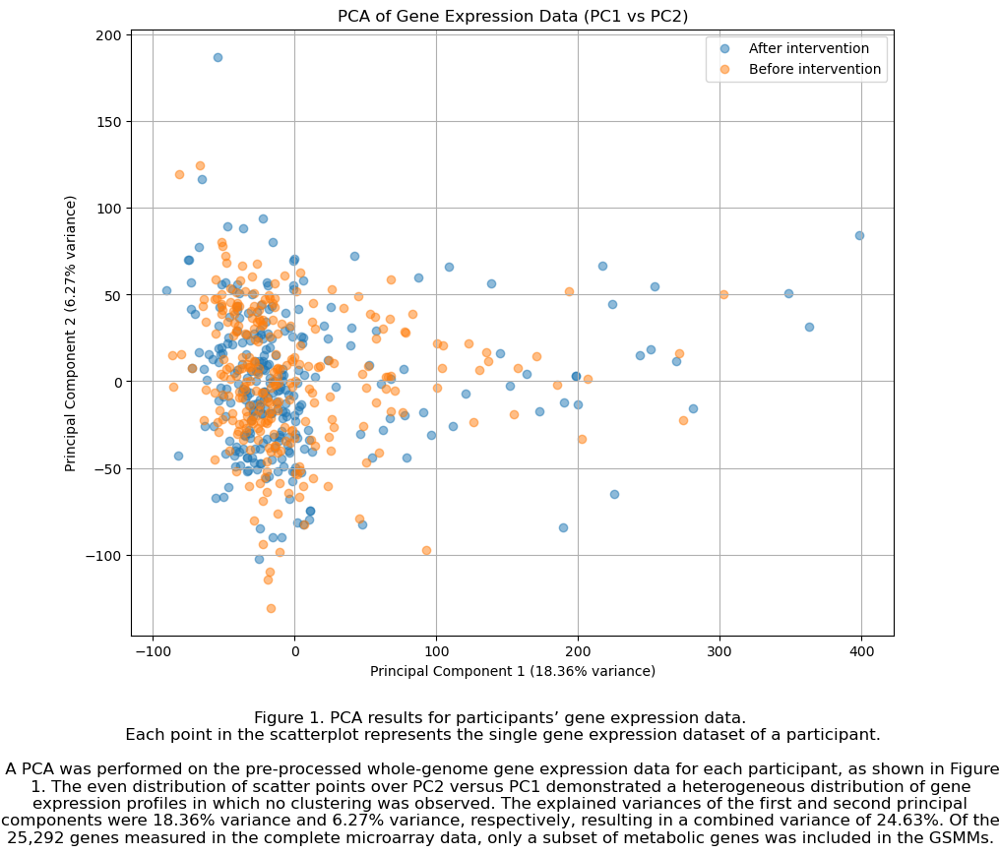

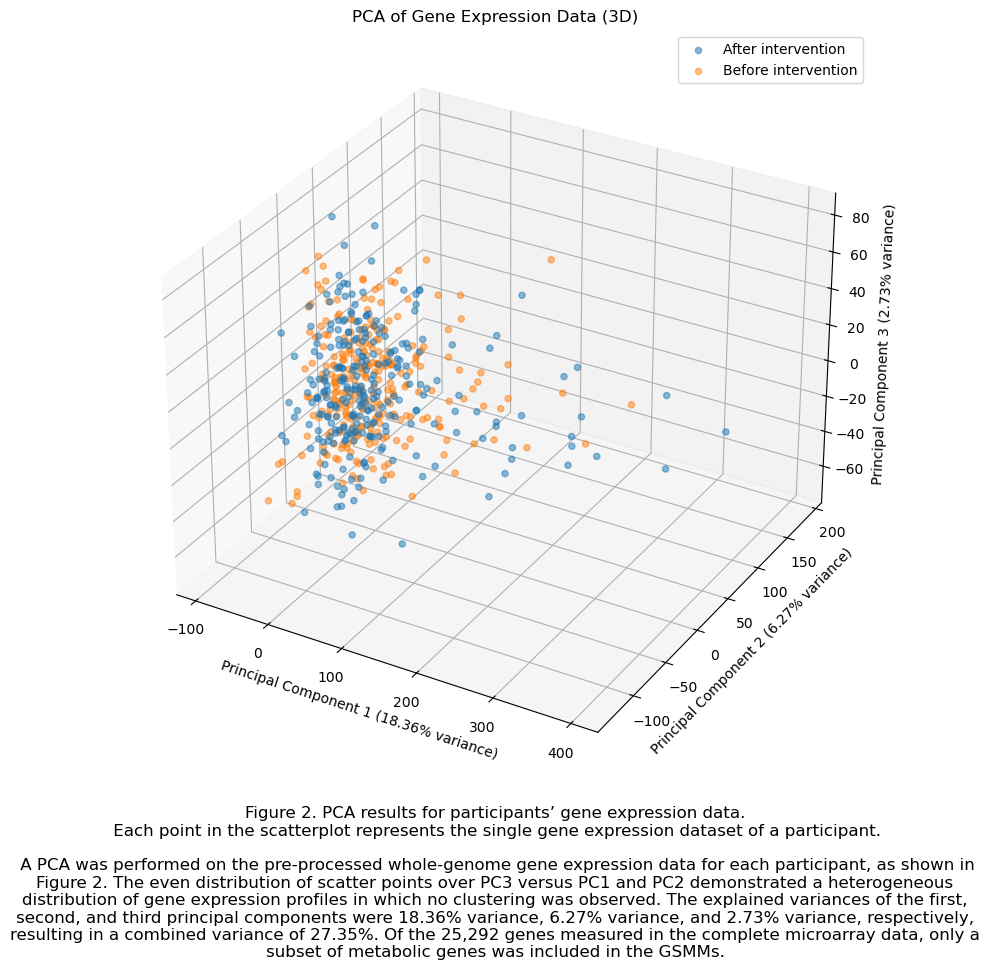

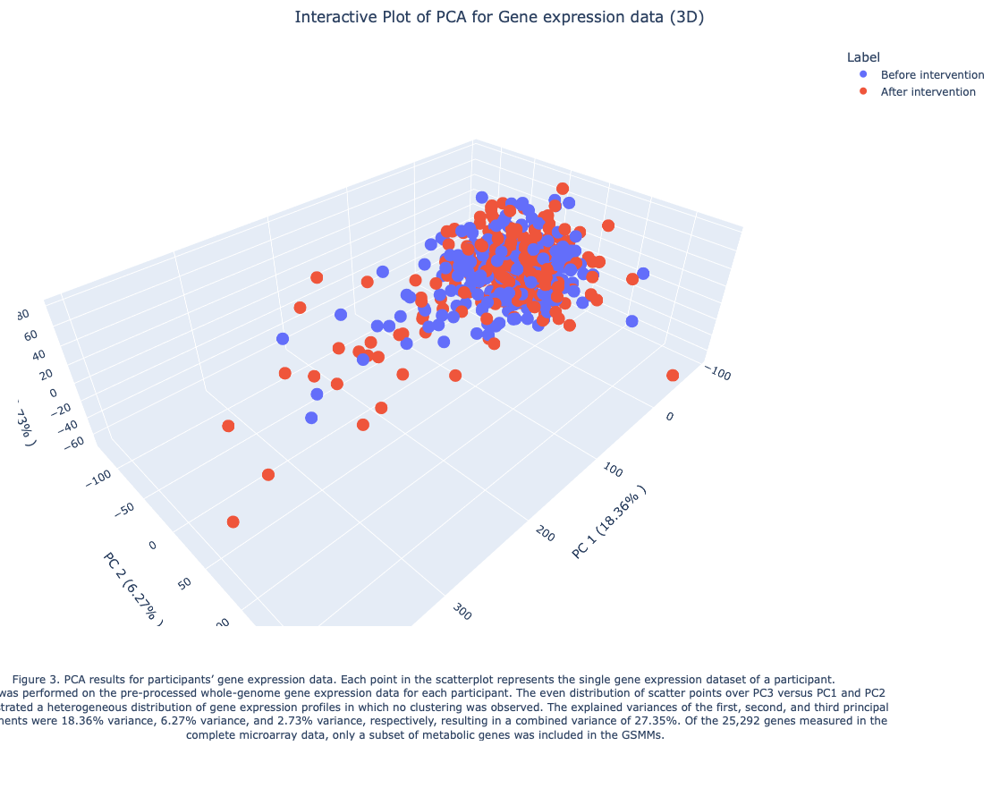

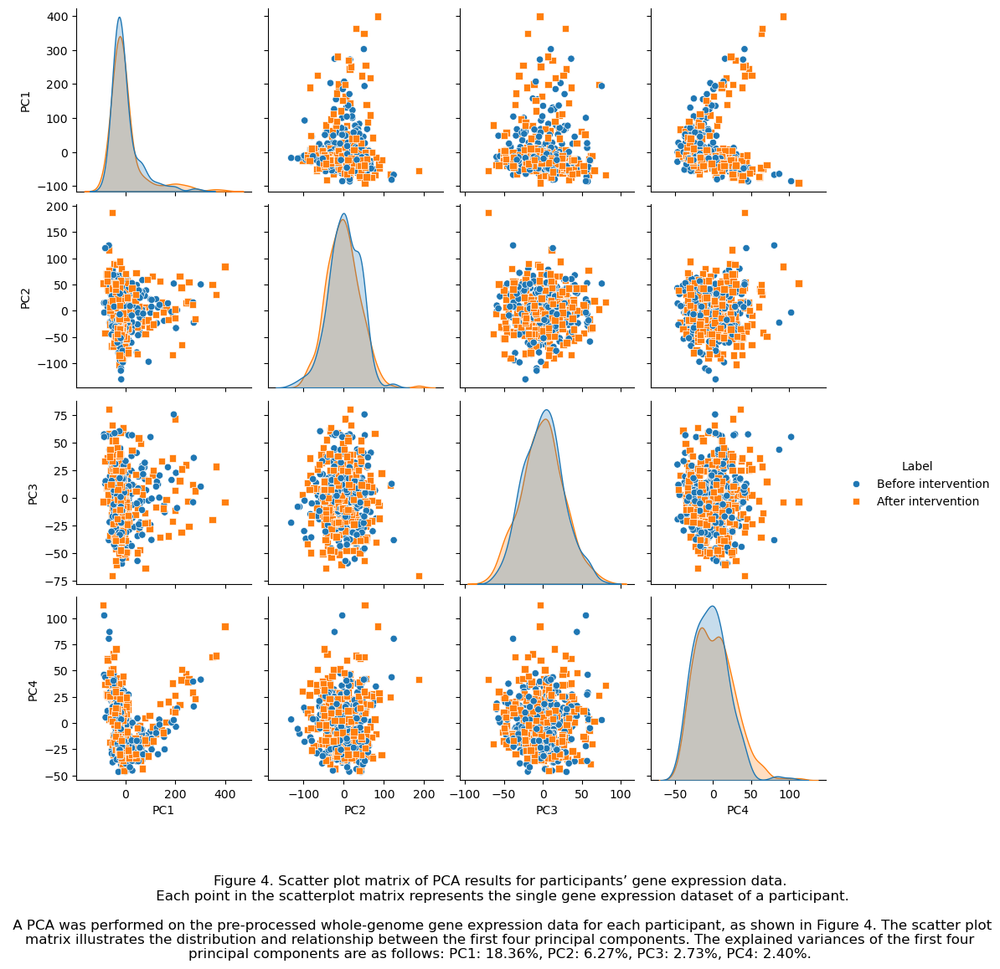

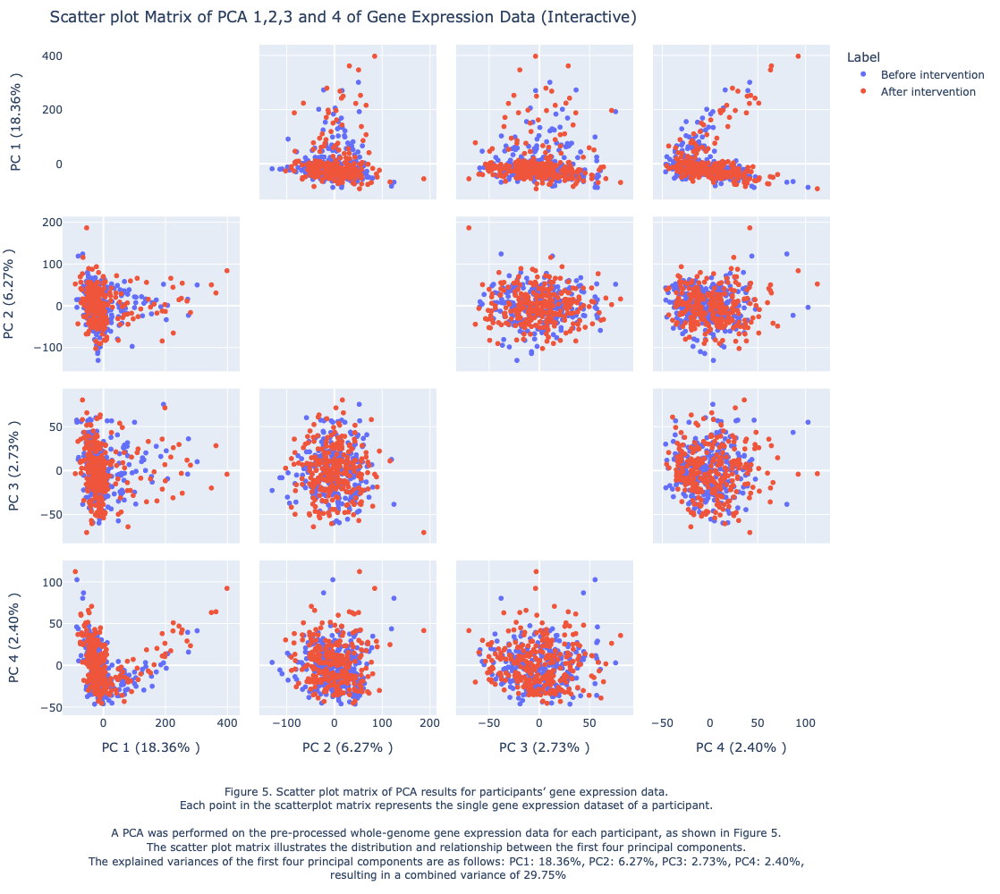

In [8]:
#############fig 1.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns


# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the day (w5 or w18)
labels = []
for sample in sample_info:
    if 'W5' in sample:
        labels.append('Before intervention')
    elif 'W18' in sample:
        labels.append('After intervention')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_

# Plot the PCA results in 2D (PC1 vs PC2)
plt.figure(figsize=(10, 8))
for label in np.unique(labels):
    plt.scatter(pca_df[pca_df['Label'] == label]['PC1'], 
                pca_df[pca_df['Label'] == label]['PC2'], 
                label=label, alpha=0.5)
plt.xlabel(f'Principal Component 1 ({explained_variance[0]*100:.2f}% variance)')
plt.ylabel(f'Principal Component 2 ({explained_variance[1]*100:.2f}% variance)')
plt.title('PCA of Gene Expression Data (PC1 vs PC2)')
plt.legend()
plt.grid()
plt.figtext(0.5, -0.15, (f'Figure 1. PCA results for participants’ gene expression data.\n Each point in the scatterplot represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 1. The even distribution of scatter points over PC2 versus PC1 demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first and second principal components were {explained_variance[0]*100:.2f}% variance and {explained_variance[1]*100:.2f}% variance, respectively, resulting in a combined variance of {((explained_variance[0]*100)+(explained_variance[1]*100)):.2f}%. Of the 25,292 genes measured in the complete microarray data, only a subset of metabolic genes was included in the GSMMs.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

#############fig 2.
# Plot the PCA results in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
for label in np.unique(labels):
    ax.scatter(pca_df[pca_df['Label'] == label]['PC1'], 
               pca_df[pca_df['Label'] == label]['PC2'], 
               pca_df[pca_df['Label'] == label]['PC3'], 
               label=label, alpha=0.5)
ax.set_xlabel(f'Principal Component 1 ({explained_variance[0]*100:.2f}% variance)')
ax.set_ylabel(f'Principal Component 2 ({explained_variance[1]*100:.2f}% variance)')
ax.set_zlabel(f'Principal Component 3 ({explained_variance[2]*100:.2f}% variance)')
plt.title('PCA of Gene Expression Data (3D)')
plt.legend()
plt.tight_layout()  # Adjust layout to ensure everything fits without overlapping
plt.figtext(0.5, -0.2, (f'Figure 2. PCA results for participants’ gene expression data.\n Each point in the scatterplot represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 2. The even distribution of scatter points over PC3 versus PC1 and PC2 demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first, second, and third principal components were {explained_variance[0]*100:.2f}% variance, {explained_variance[1]*100:.2f}% variance, and {explained_variance[2]*100:.2f}% variance, respectively, resulting in a combined variance of {((explained_variance[0]*100)+(explained_variance[1]*100)+(explained_variance[2]*100)):.2f}%. Of the 25,292 genes measured in the complete microarray data, only a subset of metabolic genes was included in the GSMMs.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

#############fig 3.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import plotly.graph_objects as go
import re

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the week
labels = []
for sample in sample_info:
    if 'W5' in sample:
        labels.append('Before intervention')
    elif 'W18' in sample:
        labels.append('After intervention')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=3)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
total_var = explained_variance.sum() * 100

# Create a 3D scatter plot using Plotly
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3', color='Label',
    title=f' Interactive Plot of PCA for Gene expression data (3D)',
    labels={'PC1': f'PC 1 ({explained_variance[0]*100:.2f}% )',
            'PC2': f'PC 2 ({explained_variance[1]*100:.2f}% )',
            'PC3': f'PC 3 ({explained_variance[2]*100:.2f}% )'}
)

# Update layout to make the plot bigger
fig.update_layout(
    width=1200,  # Width of the plot
    height=900,  # Height of the plot
    margin=dict(l=20, r=20, t=50, b=200),  # Adjust margins to make room for the annotation
    title={'x': 0.5, 'xanchor': 'center'},  # Center the title
)

# Add annotation (figure text) at the bottom
fig.add_annotation(
    text=(
        f"Figure 3. PCA results for participants’ gene expression data. Each point in the scatterplot represents the single gene expression dataset of a participant.<br> A PCA was performed on the pre-processed whole-genome gene expression data for each participant. The even distribution of scatter points over PC3 versus PC1 and PC2 <br> demonstrated a heterogeneous distribution of gene expression profiles in which no clustering was observed. The explained variances of the first, second, and third principal <br> components were {explained_variance[0]*100:.2f}% variance, {explained_variance[1]*100:.2f}% variance, and {explained_variance[2]*100:.2f}% variance, respectively, resulting in a combined variance of {total_var:.2f}%. Of the 25,292 genes measured in the<br> complete microarray data, only a subset of metabolic genes was included in the GSMMs."
    ),
    xref="paper", yref="paper",
    x=0.5, y=-0.2, showarrow=False,
    font=dict(size=12),
    align="center"
)

# Update annotation to set an explicit width
fig.update_annotations(width=1100)  # Set the width of the text box

fig.show()


#############fig 4.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the week
labels = []
for sample in sample_info:
    if 'W5' in sample:
        labels.append('Before intervention')
    elif 'W18' in sample:
        labels.append('After intervention')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
# Plot the scatter plot matrix of PCA components
sns.pairplot(pca_df, hue='Label', markers=["o", "s"])
plt.figtext(0.5, -0.15, (f'Figure 4. Scatter plot matrix of PCA results for participants’ gene expression data.\n Each point in the scatterplot matrix represents the single gene expression dataset of a participant.\n\n A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 4. The scatter plot matrix illustrates the distribution and relationship between the first four principal components. The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

# Display the PCA DataFrame with variance
pca_df.head(), explained_variance
#############fig 5.
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px


# Load the data
data = pd.read_csv(file_path, sep='\t')

# Extract the sample information from the columns
sample_info = data.columns[4:]  # Skip the first 4 columns which are gene info

# Create a label for each sample based on the week
labels = []
for sample in sample_info:
    if 'W5' in sample:
        labels.append('Before intervention')
    elif 'W18' in sample:
        labels.append('After intervention')
    else:
        labels.append('Unknown')

# Ensure labels are a numpy array for easy indexing
labels = np.array(labels)

# Filter out unknown labels if necessary
valid_indices = labels != 'Unknown'
labels = labels[valid_indices]
gene_expression_data = data.iloc[:, 4:].values[:, valid_indices]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(gene_expression_data.T)  # Transpose to have samples as rows

# Perform PCA
pca = PCA(n_components=4)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Label'] = labels

# Calculate the explained variance
explained_variance = pca.explained_variance_ratio_
total_variance = explained_variance[:4].sum() * 100


# Create labels for the plotly scatter matrix
labels = {
    'PC1': f"PC 1 ({explained_variance[0]*100:.2f}% )",
    'PC2': f"PC 2 ({explained_variance[1]*100:.2f}% )",
    'PC3': f"PC 3 ({explained_variance[2]*100:.2f}% )",
    'PC4': f"PC 4 ({explained_variance[3]*100:.2f}% )"
}

# Create the scatter plot matrix using plotly
fig = px.scatter_matrix(
    pca_df,
    dimensions=['PC1', 'PC2', 'PC3', 'PC4'],
    color='Label',
    labels=labels
)

# Update traces to hide diagonal plots
fig.update_traces(diagonal_visible=False)

# Add the figure text
fig.update_layout(
    title='Scatter plot Matrix of PCA 1,2,3 and 4 of Gene Expression Data (Interactive)',
    annotations=[
        dict(
            x=0.5,
            y=-0.1,
            showarrow=False,
            text=(
                f"Figure 5. Scatter plot matrix of PCA results for participants’ gene expression data.<br>"
                f"Each point in the scatterplot matrix represents the single gene expression dataset of a participant.<br><br>"
                f"A PCA was performed on the pre-processed whole-genome gene expression data for each participant, as shown in Figure 5.<br>"
                f"The scatter plot matrix illustrates the distribution and relationship between the first four principal components.<br>"
                f"The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, "
                f"PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%,<br> resulting in a combined variance of {total_variance:.2f}%"
            ),
            xref='paper',
            yref='paper',
            xanchor='center',
            yanchor='top',
            font=dict(size=12)
        )
    ],
    autosize=True,
    height=1000,  # Adjust the height of the plot
    width=1000,   # Adjust the width of the plot
    margin=dict(l=20, r=20, t=50, b=200)  # Adjust margins to make room for the annotation
)

fig.show()

